# HOUSING: PRICE PREDICTION

#### Problem Statement:


Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market
and there are various companies working in the domain. Data science comes as a very important tool to solve problems
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling,
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing
companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file
below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest
in them or not. For this company wants to know:
• Which variables are important to predict the price of variable?
• How do these variables describe the price of the house?


# Importing the libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import train_test_split
from scipy.stats import zscore
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings("ignore")

C:\Users\HP\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\HP\anaconda3\lib\site-packages\numpy\.libs\libopenblas.NOIJJG62EMASZI6NYURL6JBKM4EVBGM7.gfortran-win_amd64.dll
C:\Users\HP\anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


# Loading the Dataset

### We have loaded both "train" and "test" dataset


In [2]:
pd. set_option("display.max_columns", None)
pd. set_option("display.max_rows", None)
df_train = pd.read_csv("D:\housing_train.csv")
df_test = pd.read_csv("D:\housing_test.csv")

# Further Preprocessing

## "df_train" is "Training Dataset"
## "df_test" is "Test Dataset"

In [3]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [4]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


# Preporcessing


### The "Train Dataset" has 1168 rows and 81 columns that includes the target variable "SalePrice"

### The "Test Dataset" has 292 rows and 80 columns that does not include the target variable

In [5]:
print("Train Data:", df_train.shape)
print("Test Data:", df_test.shape)

Train Data: (1168, 81)
Test Data: (292, 80)


# The stats for "Train Dataset"


In [72]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,954.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1104.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.98847,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1978.193841,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,24.82875,8957.442311,1.390153,1.124343,30.145255,20.785185,182.595606,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,24.890704,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.00000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.00000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.00000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,80.00000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.00000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# The stats for "Test Dataset"


In [208]:
df_test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,MiscVal,MoSold,YrSold
count,292.000000,292.000000,247.000000,292.000000,292.000000,292.000000,292.000000,292.000000,291.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,275.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,0.0,292.000000,292.000000,292.000000
mean,755.955479,57.414384,66.425101,10645.143836,6.078767,5.493151,1972.616438,1985.294521,109.171821,439.294521,46.157534,557.315068,1042.767123,1133.691781,339.657534,3.702055,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1979.760000,1.729452,457.458904,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,NaN,28.184932,6.232877,2007.859589
std,442.565228,43.780649,21.726343,13330.669795,1.356147,1.063267,30.447016,20.105792,175.030021,429.559675,152.467119,411.043768,424.561153,366.941919,424.278825,38.219527,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,23.868875,0.754430,210.785591,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,NaN,224.036218,2.774556,1.322867
min,6.000000,20.000000,21.000000,1526.000000,3.000000,3.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,1916.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,1.000000,2006.000000
25%,377.750000,20.000000,53.500000,7200.000000,5.000000,5.000000,1954.000000,1968.000000,0.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,0.000000,1061.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1964.000000,1.000000,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,4.000000,2007.000000
50%,778.000000,50.000000,65.000000,9200.000000,6.000000,5.000000,1976.000000,1994.000000,0.000000,369.500000,0.000000,487.000000,971.000000,1047.500000,0.000000,0.000000,1440.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,1979.000000,2.000000,467.500000,0.000000,28.500000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,6.000000,2008.000000
75%,1152.250000,70.000000,79.000000,11658.750000,7.000000,6.000000,2001.000000,2003.250000,180.000000,700.500000,0.000000,780.000000,1322.000000,1370.500000,717.000000,0.000000,1720.250000,1.000000,0.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2003.000000,2.000000,569.750000,149.250000,66.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,8.000000,2009.000000
max,1456.000000,190.000000,150.000000,215245.000000,10.000000,9.000000,2009.000000,2010.000000,1031.000000,1767.000000,1085.000000,1935.000000,3094.000000,2402.000000,1589.000000,479.000000,3447.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,2010.000000,4.000000,1052.000000,728.000000,418.000000,330.000000,407.000000,396.000000,0.0,NaN,3500.000000,12.000000,2010.000000


### From the info function for both train and test data, we can find a lot of misisng values as observed below

In [19]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [20]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

### Check for Null values in tabular and in graphical format

In [32]:
df_train.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [33]:
df_test.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

### Percentage of Null values in the table

In [37]:
df_train.isnull().sum()/df_train.shape[0]*100

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      18.321918
LotArea           0.000000
Street            0.000000
Alley            93.407534
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.599315
MasVnrArea        0.599315
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.568493
BsmtCond          2.568493
BsmtExposure      2.654110
BsmtFinType1      2.568493
BsmtFinSF1        0.000000
BsmtFinType2      2.654110
BsmtFinSF2        0.000000
B

### Percentage of Null values in the table

In [39]:
df_test.isnull().sum()/df_test.shape[0]*100

Id                 0.000000
MSSubClass         0.000000
MSZoning           0.000000
LotFrontage       15.410959
LotArea            0.000000
Street             0.000000
Alley             95.205479
LotShape           0.000000
LandContour        0.000000
Utilities          0.000000
LotConfig          0.000000
LandSlope          0.000000
Neighborhood       0.000000
Condition1         0.000000
Condition2         0.000000
BldgType           0.000000
HouseStyle         0.000000
OverallQual        0.000000
OverallCond        0.000000
YearBuilt          0.000000
YearRemodAdd       0.000000
RoofStyle          0.000000
RoofMatl           0.000000
Exterior1st        0.000000
Exterior2nd        0.000000
MasVnrType         0.342466
MasVnrArea         0.342466
ExterQual          0.000000
ExterCond          0.000000
Foundation         0.000000
BsmtQual           2.397260
BsmtCond           2.397260
BsmtExposure       2.397260
BsmtFinType1       2.397260
BsmtFinSF1         0.000000
BsmtFinType2       2

<AxesSubplot:>

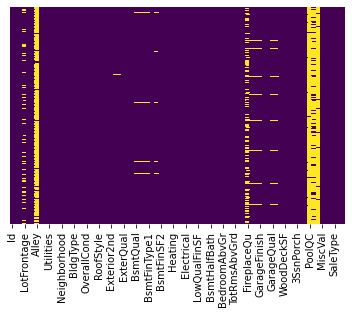

In [23]:
sns.heatmap(df_train.isnull(), yticklabels=False, cbar=False, cmap="viridis")

<AxesSubplot:>

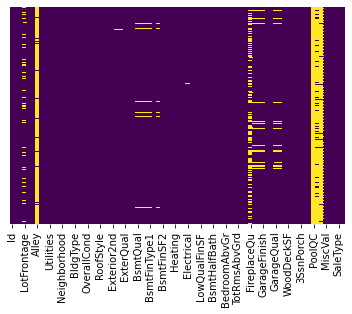

In [24]:
sns.heatmap(df_test.isnull(), yticklabels=False, cbar=False, cmap="viridis")

# Fill the missing values for both "Traning" and "Test" dataset

In [14]:
# Fill the columns with mean as its continous data

df_train["LotFrontage"].fillna(df_train["LotFrontage"].mean(), inplace=True)
df_train["MasVnrArea"].fillna(df_train["MasVnrArea"].mean(), inplace=True)

In [15]:
# Fill the columns with mode as its categorical data

df_train["MasVnrType"].fillna(df_train["MasVnrType"].value_counts().index[0], inplace=True)
df_train["BsmtQual"].fillna(df_train["BsmtQual"].value_counts().index[0], inplace=True)
df_train["BsmtCond"].fillna(df_train["BsmtCond"].value_counts().index[0], inplace=True)
df_train["BsmtExposure"].fillna(df_train["BsmtExposure"].value_counts().index[0], inplace=True)
df_train["BsmtFinType1"].fillna(df_train["BsmtFinType1"].value_counts().index[0], inplace=True)
df_train["BsmtFinType2"].fillna(df_train["BsmtFinType2"].value_counts().index[0], inplace=True)
df_train["FireplaceQu"].fillna(df_train["FireplaceQu"].value_counts().index[0], inplace=True)
df_train["GarageType"].fillna(df_train["GarageType"].value_counts().index[0], inplace=True)
df_train["GarageYrBlt"].fillna(df_train["GarageYrBlt"].value_counts().index[0], inplace=True)
df_train["GarageFinish"].fillna(df_train["GarageFinish"].value_counts().index[0], inplace=True)
df_train["GarageQual"].fillna(df_train["GarageQual"].value_counts().index[0], inplace=True)
df_train["GarageCond"].fillna(df_train["GarageCond"].value_counts().index[0], inplace=True)

In [9]:
# Fill the columns with mean as its continous data

df_test["LotFrontage"].fillna(df_test["LotFrontage"].mean(), inplace=True)
df_test["MasVnrArea"].fillna(df_test["MasVnrArea"].mean(), inplace=True)

In [10]:
# Fill the columns with mode as its categorical data

df_test["MasVnrType"].fillna(df_test["MasVnrType"].value_counts().index[0], inplace=True)
df_test["BsmtQual"].fillna(df_test["BsmtQual"].value_counts().index[0], inplace=True)
df_test["BsmtCond"].fillna(df_test["BsmtCond"].value_counts().index[0], inplace=True)
df_test["BsmtExposure"].fillna(df_test["BsmtExposure"].value_counts().index[0], inplace=True)
df_test["BsmtFinType1"].fillna(df_test["BsmtFinType1"].value_counts().index[0], inplace=True)
df_test["BsmtFinType2"].fillna(df_test["BsmtFinType2"].value_counts().index[0], inplace=True)
df_test["FireplaceQu"].fillna(df_test["FireplaceQu"].value_counts().index[0], inplace=True)
df_test["GarageType"].fillna(df_test["GarageType"].value_counts().index[0], inplace=True)
df_test["GarageYrBlt"].fillna(df_test["GarageYrBlt"].value_counts().index[0], inplace=True)
df_test["GarageFinish"].fillna(df_test["GarageFinish"].value_counts().index[0], inplace=True)
df_test["GarageQual"].fillna(df_test["GarageQual"].value_counts().index[0], inplace=True)
df_test["GarageCond"].fillna(df_test["GarageCond"].value_counts().index[0], inplace=True)
df_test["Electrical"].fillna(df_test["Electrical"].value_counts().index[0], inplace=True)

### Dropped the following columns as they had more amout of missing values

In [11]:
df_train.drop(columns = ["Alley", "PoolQC", "Fence", "MiscFeature"], axis=1, inplace=True)

In [12]:
df_test.drop(columns = ["Alley", "PoolQC", "Fence", "MiscFeature"], axis=1, inplace=True)

# Let's check if we still have Null values

### Null values have been removed, for both features in "Train" and  we never had any missing values in "Test" dataset

In [16]:
df_train.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

In [17]:
df_test.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

# Let's check the same output using a Heatmap for both "Train" and "Test" dataset

<AxesSubplot:>

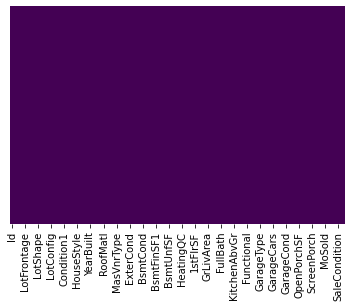

In [53]:
# train data set

sns.heatmap(df_train.isnull(), yticklabels=False, cbar=False, cmap="viridis")

<AxesSubplot:>

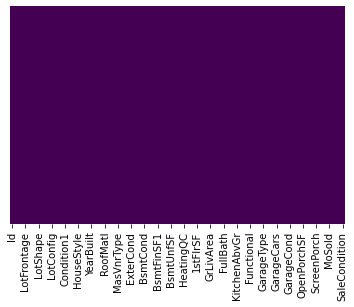

In [54]:
# test data set

sns.heatmap(df_test.isnull(), yticklabels=False, cbar=False, cmap="viridis")

#### From the below plot we can identify the zoning area of the properties / apartments that are up for sale.

#### We can see from this plot that "RL" (Residential Low Density) areas are up for sale more than other zones.

#### The low thickness private zones are planned to make, keep up with, and advance neighborhoods with bigger parcel sizes where the land use is fundamentally single-family abodes. They take into account some nonhousehold living uses however keep up with the general person of a solitary family area.

#### It makes sense as if the zones that fall in green belt or agriculture then using it for commercial purpose is not possible unless the land is infertile. This appears to be a large resential neighbourhood.



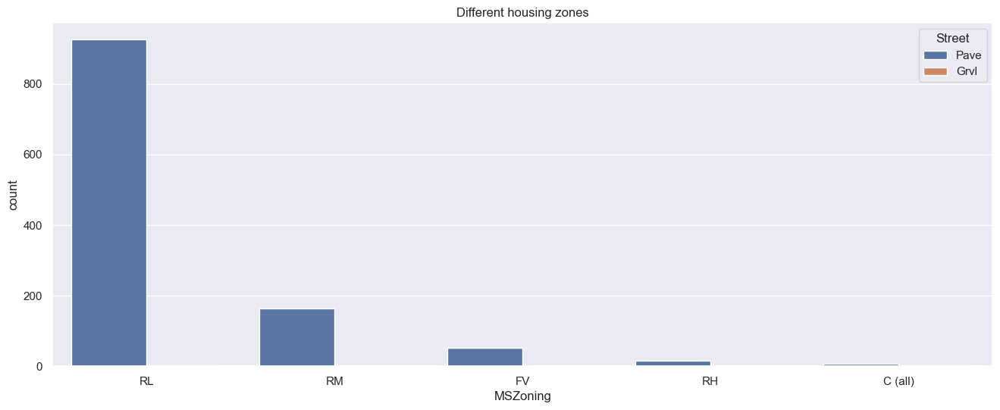

In [257]:
# MSZoning: Identifies the general zoning classification of the sale.

# A   Agriculture
# C   Commercial
# FV  Floating Village Residential
# I   Industrial
# RH  Residential High Density
# RL  Residential Low Density
# RP  Residential Low Density Park 
# RM  Residential Medium Density


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot("MSZoning", data=df_train, hue= "Street").set(title='Different housing zones') 
plt.show()

#### The below plot gives us idea on the locality of neughbourhood of teh residences within Ames city limits.

#### Ames is a city in Story County, Iowa, United States and the properties belong to the "Northwest Ames" in majority followed by "College Creek" and these areas are also known to have given properties on rent, lease etc. whioch included both apartments and condos.

#### As per a couple of surverys, cost of living anywhere in USA above 100 points is considered expensive and Iowa's cost of living is 83.7 which includes all essentials like job, grocery, housing etc. This states that it's one of the most sought of place in the USA if budget friendly home is a priority. 

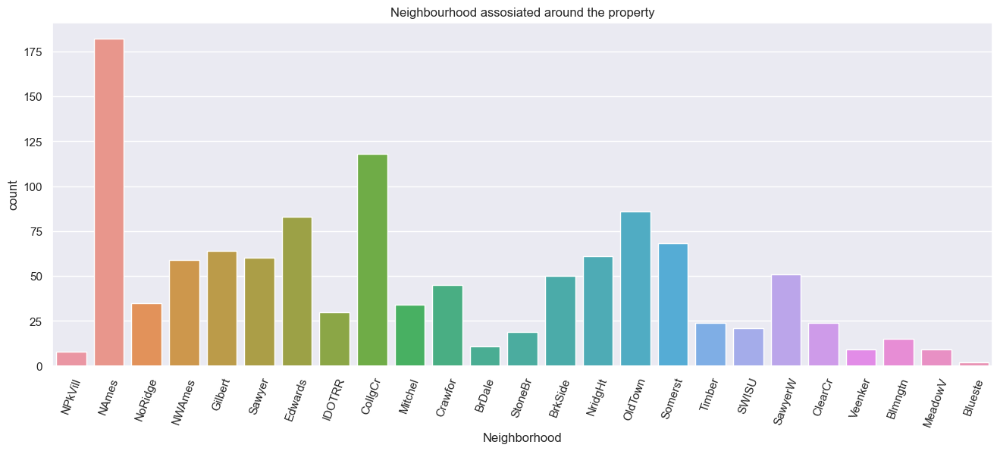

In [281]:


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot("Neighborhood", data=df_train).set(title='Neighbourhood assosiated around the property') 
plt.xticks(rotation=70)
plt.show()

#### Let's observe if there is any relation between sales price of the properties over the years.

#### We can see that majority of high property sales have occured in the year 2010, especially if the properties are either "New" or if it's on a Contract 15% Down payment regular terms. 

#### A such a downpayment is possible if the person looking forward to purchase has a steady income. 

#### Higher the downpayment, better the loan rates and since cost of living is so important. This could be an ideal option for people who cannot afford or do not wish to spend all at once. 

#### We can also see the sales prices although less for the year 2007 when compared now, it was highest for that period of time. This show's how real estates values have increased over period of time for certain type of properties all over Iowa.

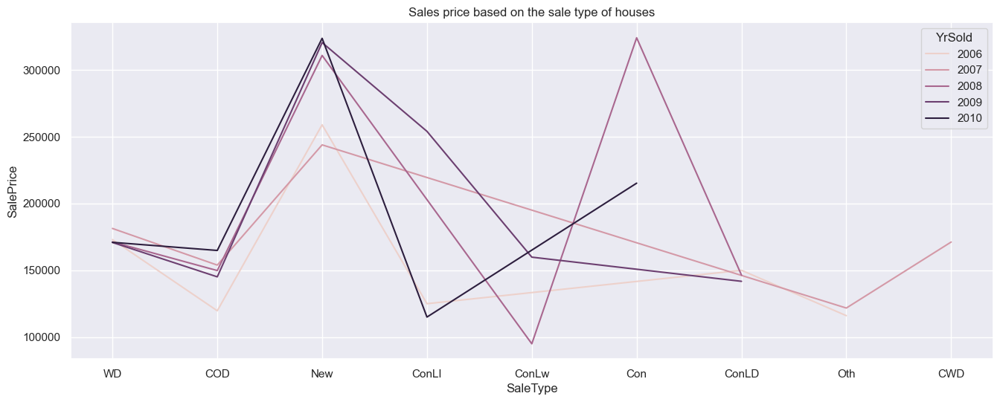

In [228]:
#SaleType: Type of sale

       #WD    Warranty Deed - Conventional
       #CWD   Warranty Deed - Cash
       #VWD   Warranty Deed - VA Loan
       #New   Home just constructed and sold
       #COD   Court Officer Deed/Estate
       #Con   Contract 15% Down payment regular terms
       #ConLw Contract Low Down payment and low interest
       #ConLI Contract Low Interest
       #ConLD Contract Low Down
       #Oth   Other


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
sns.lineplot(data=df_train, x="SaleType", y="SalePrice", hue = "YrSold", ci=None).set(title='Sales price based on the sale type of houses')
plt.show()

#### The below plot shows us the years when properties were sold the highest.

#### And it appears in th year 2006 and 2007 sales were high but gradually decreased in th year 2008 untill 2010. 

#### The monetary emergency of 2007-2008 was a very long time really taking shape. 

#### By the late spring of 2007, monetary business sectors all throughout the planet were giving indications that the retribution was late for quite some time long gorge on modest credit.

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


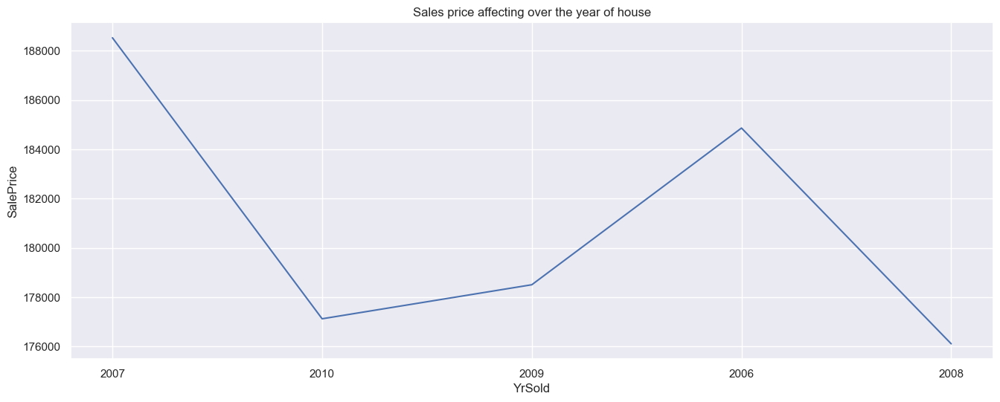

In [227]:


year_new = df_train['YrSold'].astype(str)


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
sns.lineplot(data=df_train, x=year_new, y="SalePrice", ci=None).set(title='Sales price affecting over the year of house')
plt.show()

#### We can see from the below plot that thought the years only "Normal sales" houses were bought compared to already existing. 

#### Customers did not seem to go for options like trade, foreclosure, short sale or sale between families and seldom preferred houses that were partially unfinished.

#### This is a clear indication that when a person get's on a market price withoiut middleman or brokers customers tend to get direct and better deals thus saving money to some extent.

#### Also in general people prefer buying houses that are pose less threat and hassles, means less and concrete paperworks, easier way of getting loans for houses which seems ideal whn going with Normal Sales compared to other type of sales conditions.

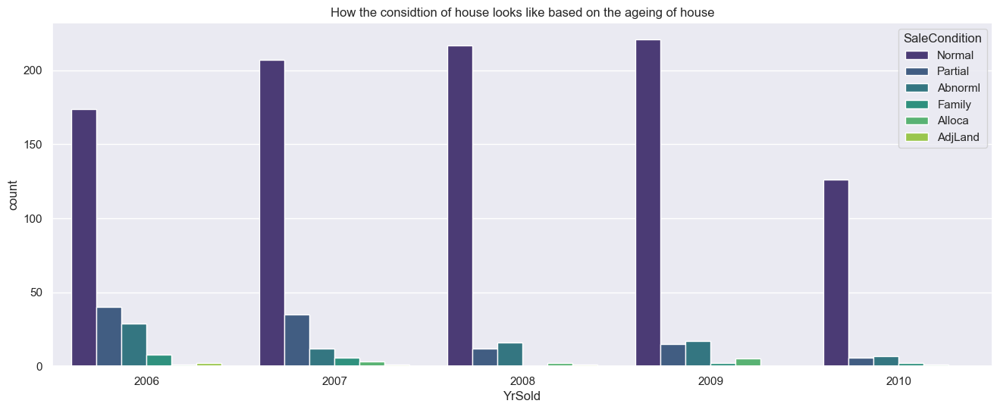

In [233]:
# SaleCondition: Condition of sale

       # Normal	Normal Sale
       # Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       # AdjLand	Adjoining Land Purchase
       # Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
      # Family	Sale between family members
      # Partial	Home was not completed when last assessed (associated with New Homes)


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot("YrSold", data=df_train, palette= "viridis", 
                   hue="SaleCondition").set(title='How the considtion of house looks like based on the ageing of house') 
plt.show()

#### An assurance deed is a kind of deed where the grantor (seller) guarantees that the person being referred to holds clear title to a real estate parcel and has a choice to bring to the table it to the grantee (buyer), instead of a quitclaim deed, where the vendor doesn't guarantee that the individual holds title to a land parcel. 

#### An assurance deed is a record routinely used in land that gives the best proportion of protection to the purchaser of the property. The deed pledges or warrants that the owner cases the property totally free in regards to any exceptional liens, contracts, or various encumbrances

#### It appears Warranty Deed seems to be the most sought after payment or purchasing method as it's clearly in favour of both the parties as and when the duration of built year and sale year increases.

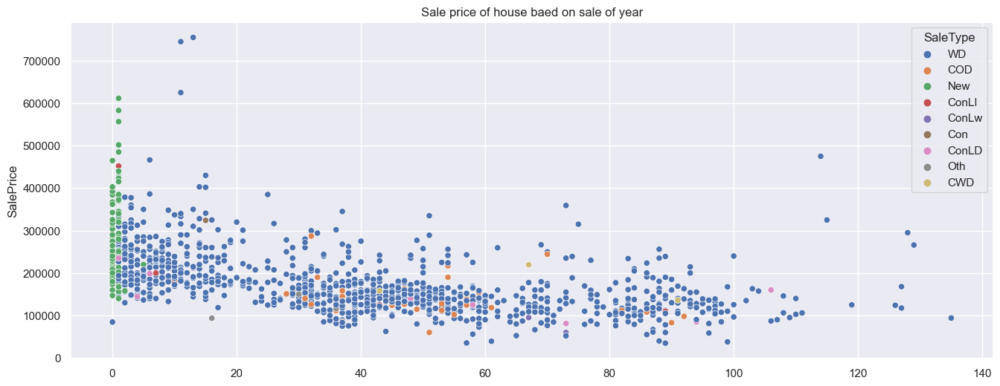

In [254]:
#SaleType: Type of sale

       # WD 	Warranty Deed - Conventional
       # CWD	Warranty Deed - Cash
       # VWD	Warranty Deed - VA Loan
       # New	Home just constructed and sold
       # COD	Court Officer Deed/Estate
       # Con	Contract 15% Down payment regular terms
       # ConLw	Contract Low Down payment and low interest
       # ConLI	Contract Low Interest
       # ConLD	Contract Low Down
       # Oth	Other


gap_of_sale = df_train["YrSold"] - df_train["YearBuilt"]


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
sns.scatterplot(data=df_train, x=gap_of_sale, 
                y="SalePrice", hue="SaleType").set(title='Sale price of house baed on sale of year')
plt.show()

#### It appears from the below plot that number of years taken to remodel doesn't realy seem to affect the sale type. 

#### Apart from New, in such cases also people seem to prefer WD over other sale types. Hence in a way, both selling of properties with or without remodelling completely or to some extent doesn't really seem to affect the value.

#### Maybe because of abundance of properties across neighborhood, a customer has multiple options to go with.


#### But if the housae is newly built that has not completed i.e. partially completed, then only it seems to fetch good amount if remodelled as the market value doesn't seem to diminish the actual value.

#### This could be common amongst those who buy houses at a cheaper rate and rent it to other parties to get a potential and steady income.

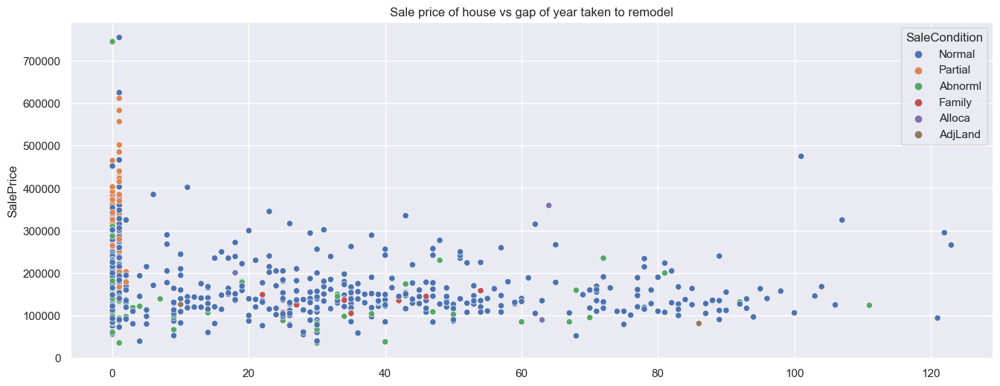

In [247]:
#SaleCondition: Condition of sale

       # Normal   Normal Sale
       # Abnorml  Abnormal Sale -  trade, foreclosure, short sale
       # AdjLand  Adjoining Land Purchase
       # Alloca	Allocation   two linked properties with separate deeds, typically condo with a garage unit	
       # Family   Sale between family members
       # Partial  Home was not completed when last assessed (associated with New Homes)



gap_of_model = df_train["YearRemodAdd"] - df_train["YearBuilt"]


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
sns.scatterplot(data=df_train, x=gap_of_model, 
                y="SalePrice", hue="SaleCondition").set(title='Sale price of house vs gap of year taken to remodel')
plt.show()

#### We can see that the roadways or streets seems to play an important role.

#### Houses / properties that are in neighborhoods, condos, villa's etc fetch good amount of values and if it was remodelled or partially completed it seems to get even higher sale to some extent.

#### But apart from these, customers may also prefer to go to areas that are near to roads, hence connectivity could be a key factor. 

#### Properties near to feeder street ( inner / interior roads) and also on arterial street ( junction roads) are the second sought after properties and majority in all cases normal sale type is highly preferred. 

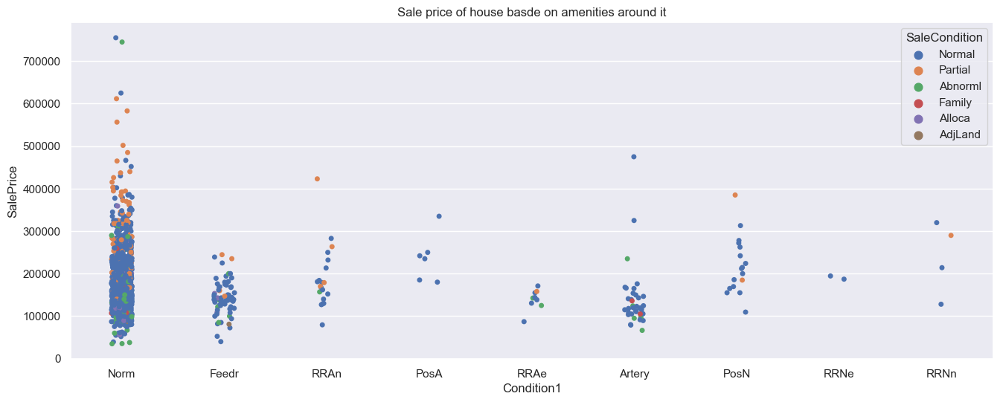

In [274]:
#Condition1: Proximity to various conditions

       # Artery	Adjacent to arterial street
       # Feedr	Adjacent to feeder street	
       # Norm	Normal	
       # RRNn	Within 200' of North-South Railroad
       # RRAn	Adjacent to North-South Railroad
       # PosN	Near positive off-site feature--park, greenbelt, etc.
       # PosA	Adjacent to postive off-site feature
       # RRNe	Within 200' of East-West Railroad
       # RRAe	Adjacent to East-West Railroad


plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
sns.stripplot(data=df_train, x="Condition1", 
                y="SalePrice", hue="SaleCondition").set(title='Sale price of house basde on amenities around it')
plt.show()

#### We can see from the below plot that "Waranty Deed" and "New" are favourable throughout the year and since it's a procedure, it doesn't really seem to be affected by months.

#### But we can see that apart from these options, people may also prefer "COD" (Court Officer Deed) and it seems to appear often between the months May to October.

#### Court Officer Deed - A deed where an agent or director of a home or a conservator of the property of a ward moves title for the benefit of a bequest or conservatorship. Court endorsement might be important before the State can acknowledge this sort of transport.

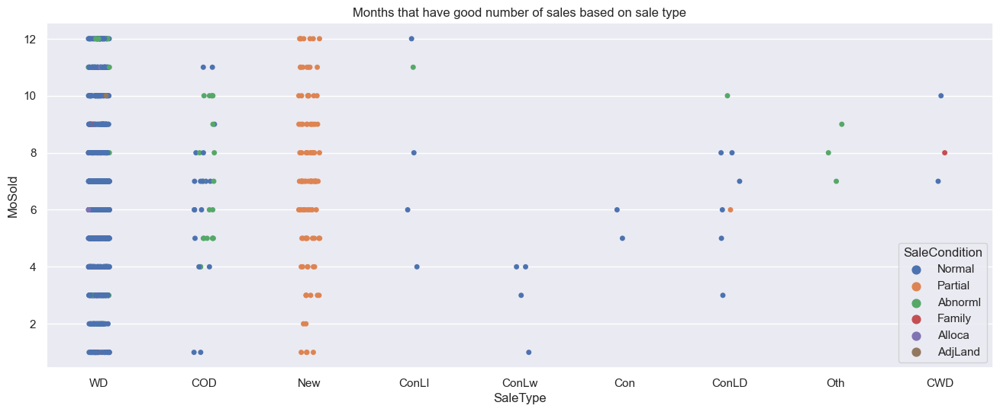

In [285]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
sns.stripplot(data=df_train, x="SaleType", 
                y="MoSold", hue="SaleCondition").set(title='Months that have good number of sales based on sale type')
plt.show()

#### Displaying the total columns names to select features for encoding

In [79]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodD

# Encoding the dataset

### I have used LabelEncoder the following columns

In [18]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()

# Encode the training dataset

df_train.MSZoning = encoder.fit_transform(df_train.MSZoning)
df_train.Street = encoder.fit_transform(df_train.Street)
df_train.LotShape = encoder.fit_transform(df_train.LotShape)
df_train.LandContour = encoder.fit_transform(df_train.LandContour)
df_train.Utilities = encoder.fit_transform(df_train.Utilities)
df_train.LotConfig = encoder.fit_transform(df_train.LotConfig)
df_train.LandSlope = encoder.fit_transform(df_train.LandSlope)
df_train.Neighborhood = encoder.fit_transform(df_train.Neighborhood)
df_train.Condition1 = encoder.fit_transform(df_train.Condition1)
df_train.Condition2 = encoder.fit_transform(df_train.Condition2)
df_train.BldgType = encoder.fit_transform(df_train.BldgType)
df_train.HouseStyle = encoder.fit_transform(df_train.HouseStyle)
df_train.RoofStyle = encoder.fit_transform(df_train.RoofStyle)
df_train.RoofMatl = encoder.fit_transform(df_train.RoofMatl)
df_train.Exterior1st = encoder.fit_transform(df_train.Exterior1st)
df_train.Exterior2nd = encoder.fit_transform(df_train.Exterior2nd)
df_train.MasVnrType = encoder.fit_transform(df_train.MasVnrType)
df_train.ExterQual = encoder.fit_transform(df_train.ExterQual)
df_train.ExterCond = encoder.fit_transform(df_train.ExterCond)
df_train.Foundation = encoder.fit_transform(df_train.Foundation)
df_train.BsmtQual = encoder.fit_transform(df_train.BsmtQual)
df_train.BsmtCond = encoder.fit_transform(df_train.BsmtCond)
df_train.BsmtExposure = encoder.fit_transform(df_train.BsmtExposure)
df_train.BsmtFinType1 = encoder.fit_transform(df_train.BsmtFinType1)
df_train.BsmtFinType2 = encoder.fit_transform(df_train.BsmtFinType2)
df_train.Heating = encoder.fit_transform(df_train.Heating)
df_train.HeatingQC = encoder.fit_transform(df_train.HeatingQC)
df_train.CentralAir = encoder.fit_transform(df_train.CentralAir)
df_train.Electrical = encoder.fit_transform(df_train.Electrical)
df_train.KitchenQual = encoder.fit_transform(df_train.KitchenQual)
df_train.Functional = encoder.fit_transform(df_train.Functional)
df_train.FireplaceQu = encoder.fit_transform(df_train.FireplaceQu)
df_train.GarageType = encoder.fit_transform(df_train.GarageType)
df_train.GarageFinish = encoder.fit_transform(df_train.GarageFinish)
df_train.GarageQual = encoder.fit_transform(df_train.GarageQual)
df_train.GarageCond = encoder.fit_transform(df_train.GarageCond)
df_train.SaleType = encoder.fit_transform(df_train.SaleType)
df_train.SaleCondition = encoder.fit_transform(df_train.SaleCondition)
df_train.PavedDrive = encoder.fit_transform(df_train.PavedDrive)




# Encode the test dataset

df_test.MSZoning = encoder.fit_transform(df_test.MSZoning)
df_test.Street = encoder.fit_transform(df_test.Street)
df_test.LotShape = encoder.fit_transform(df_test.LotShape)
df_test.LandContour = encoder.fit_transform(df_test.LandContour)
df_test.Utilities = encoder.fit_transform(df_test.Utilities)
df_test.LotConfig = encoder.fit_transform(df_test.LotConfig)
df_test.LandSlope = encoder.fit_transform(df_test.LandSlope)
df_test.Neighborhood = encoder.fit_transform(df_test.Neighborhood)
df_test.Condition1 = encoder.fit_transform(df_test.Condition1)
df_test.Condition2 = encoder.fit_transform(df_test.Condition2)
df_test.BldgType = encoder.fit_transform(df_test.BldgType)
df_test.HouseStyle = encoder.fit_transform(df_test.HouseStyle)
df_test.RoofStyle = encoder.fit_transform(df_test.RoofStyle)
df_test.RoofMatl = encoder.fit_transform(df_test.RoofMatl)
df_test.Exterior1st = encoder.fit_transform(df_test.Exterior1st)
df_test.Exterior2nd = encoder.fit_transform(df_test.Exterior2nd)
df_test.MasVnrType = encoder.fit_transform(df_test.MasVnrType)
df_test.ExterQual = encoder.fit_transform(df_test.ExterQual)
df_test.ExterCond = encoder.fit_transform(df_test.ExterCond)
df_test.Foundation = encoder.fit_transform(df_test.Foundation)
df_test.BsmtQual = encoder.fit_transform(df_test.BsmtQual)
df_test.BsmtCond = encoder.fit_transform(df_test.BsmtCond)
df_test.BsmtExposure = encoder.fit_transform(df_test.BsmtExposure)
df_test.BsmtFinType1 = encoder.fit_transform(df_test.BsmtFinType1)
df_test.BsmtFinType2 = encoder.fit_transform(df_test.BsmtFinType2)
df_test.Heating = encoder.fit_transform(df_test.Heating)
df_test.HeatingQC = encoder.fit_transform(df_test.HeatingQC)
df_test.CentralAir = encoder.fit_transform(df_test.CentralAir)
df_test.Electrical = encoder.fit_transform(df_test.Electrical)
df_test.KitchenQual = encoder.fit_transform(df_test.KitchenQual)
df_test.Functional = encoder.fit_transform(df_test.Functional)
df_test.FireplaceQu = encoder.fit_transform(df_test.FireplaceQu)
df_test.GarageType = encoder.fit_transform(df_test.GarageType)
df_test.GarageFinish = encoder.fit_transform(df_test.GarageFinish)
df_test.GarageQual = encoder.fit_transform(df_test.GarageQual)
df_test.GarageCond = encoder.fit_transform(df_test.GarageCond)
df_test.SaleType = encoder.fit_transform(df_test.SaleType)
df_test.SaleCondition = encoder.fit_transform(df_test.SaleCondition)
df_test.PavedDrive = encoder.fit_transform(df_test.PavedDrive)

# Datasets have now been encoded

In [19]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,70.98847,4928,1,0,3,0,4,0,13,2,2,4,2,6,5,1976,1976,1,1,8,9,2,0.0,3,4,1,2,3,3,0,120,5,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,4,1,1977.0,1,2,440,4,4,2,0,205,0,0,0,0,0,2,2007,8,4,128000
1,889,20,3,95.00000,15865,1,0,3,0,4,1,12,2,2,0,2,8,6,1970,1970,0,5,12,13,2,0.0,2,2,2,3,1,1,0,351,4,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,4,1,1970.0,2,2,621,4,4,2,81,207,0,0,224,0,0,10,2007,8,4,268000
2,793,60,3,92.00000,9920,1,0,3,0,1,0,15,2,2,0,5,7,5,1996,1997,1,1,7,7,2,0.0,2,4,2,2,3,0,2,862,5,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,4,1,1997.0,2,2,455,4,4,2,180,130,0,0,0,0,0,6,2007,8,4,269790
3,110,20,3,105.00000,11751,1,0,3,0,4,0,14,2,2,0,2,6,6,1977,1977,3,1,8,9,1,480.0,3,4,1,2,3,3,1,705,5,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,4,1,1977.0,1,2,546,4,4,2,0,122,0,0,0,0,0,1,2010,0,4,190000
4,422,20,3,70.98847,16635,1,0,3,0,2,0,14,2,2,0,2,6,7,1977,2000,1,1,4,4,3,126.0,2,4,1,2,3,3,0,1246,5,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,4,1,1977.0,0,2,529,4,4,2,240,0,0,0,0,0,0,6,2009,8,4,215000


In [20]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,2,86.000000,14157,1,0,1,0,0,0,21,2,0,0,2,9,5,2005,2006,3,0,9,11,3,200.0,2,3,2,0,2,1,2,1249,5,0,673,1922,0,0,1,3,1922,0,0,1922,1,0,2,0,3,1,2,8,5,1,2,1,2005.0,0,3,676,4,4,2,178,51,0,0,0,0,0,7,2007,5,2
1,1018,120,2,66.425101,5814,1,0,3,0,1,0,21,2,0,4,2,8,5,1984,1984,1,0,5,5,2,0.0,2,3,1,2,2,0,2,1036,5,0,184,1220,0,2,1,3,1360,0,0,1360,1,0,1,0,1,1,2,4,5,1,0,1,1984.0,1,2,565,4,4,2,63,0,0,0,0,0,0,8,2009,0,0
2,929,20,2,66.425101,11838,1,3,3,0,4,0,4,2,0,0,2,8,5,2001,2001,3,0,9,11,2,0.0,2,3,2,2,2,0,5,0,5,0,1753,1753,0,0,1,3,1788,0,0,1788,0,0,2,0,3,1,0,7,5,1,4,1,2001.0,1,2,522,4,4,2,202,151,0,0,0,0,0,6,2009,5,2
3,1148,70,2,75.000000,12000,1,3,0,0,4,0,5,2,0,0,5,7,7,1941,1950,1,0,6,7,2,0.0,3,3,1,3,2,3,4,275,5,0,429,704,0,0,1,3,860,704,0,1564,0,0,1,1,3,1,1,7,5,1,2,1,1941.0,2,1,234,4,4,2,0,0,0,0,0,0,0,7,2009,5,2
4,1227,60,2,86.000000,14598,1,0,3,0,1,0,20,1,0,0,5,6,5,2007,2007,1,0,9,11,3,74.0,2,3,2,2,2,2,5,0,5,0,894,894,0,0,1,3,894,1039,0,1933,0,0,2,1,4,1,2,9,5,1,2,3,2007.0,0,3,668,4,4,2,100,18,0,0,0,0,0,1,2008,5,2


# Let's now observe the stats of the dataset

### All the values are accounted for and has no missing values

#### Difference between mean and std also seems fine .

In [21]:
df_train.describe()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.0,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,3.013699,70.988470,10484.749144,0.996575,1.938356,2.773973,0.0,3.004281,0.064212,12.145548,2.032534,2.005993,0.476027,3.043664,6.104452,5.595890,1970.930651,1984.758562,1.402397,1.086473,8.659247,9.363014,1.758562,102.310078,2.530822,3.725171,1.395548,2.282534,2.802226,2.273116,2.798801,444.726027,4.713185,46.647260,569.721747,1061.095034,1.035959,1.569349,0.933219,3.688356,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,2.328767,6.542808,5.742295,0.617295,2.389555,2.225171,1979.717466,1.233733,1.776541,476.860445,3.872432,3.905822,1.853596,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,7.465753,3.768836,181477.005993
std,416.159877,41.940650,0.633120,22.437056,8957.442311,0.058445,1.412262,0.710027,0.0,1.642667,0.284088,6.010364,0.871703,0.250035,1.180870,1.898625,1.390153,1.124343,30.145255,20.785185,0.832539,0.642848,3.097443,3.462380,0.611174,182.047152,0.699425,0.744463,0.709379,0.857830,0.674746,1.144218,1.837839,462.664785,0.925186,163.520016,449.375525,442.272249,0.302078,1.749129,0.249749,1.042606,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,0.832992,1.598484,0.987250,0.650575,0.905923,1.767017,25.012983,0.809747,0.745554,214.466769,0.592724,0.503323,0.501894,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,1.619459,1.112208,79105.586863
min,1.000000,20.000000,0.000000,21.000000,1300.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,0.000000,34900.000000
25%,360.500000,20.000000,3.000000,60.000000,7621.500000

In [22]:
df_test.describe()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,292.000000,292.000000,292.000000,292.000000,292.000000
mean,755.955479,57.414384,2.136986,66.425101,10645.143836,0.993151,1.958904,2.791096,0.003425,3.078767,0.054795,11.681507,2.023973,0.003425,0.561644,3.017123,6.078767,5.493151,1972.616438,1985.294521,1.441781,0.010274,7.404110,8.780822,1.777397,109.171821,2.575342,2.876712,1.400685,2.270548,1.928082,2.328767,2.681507,439.294521,4.726027,46.157534,557.315068,1042.767123,0.037671,1.15411,0.941781,2.750000,1133.691781,339.657534,3.702055,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,2.383562,6.417808,4.835616,0.595890,2.376712,2.140411,1981.171233,1.208904,1.729452,457.458904,3.869863,3.904110,1.866438,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,28.184932,6.232877,2007.859589,4.828767,1.914384
std,442.565228,43.780649,0.478114,19.975962,13330.669795,0.082618,1.398953,0.699182,0.058521,1.541174,0.242576,6.004975,0.834876,0.058521,1.265305,1.964386,1.356147,1.063267,30.447016,20.105792,0.845466,0.130676,2.302184,3.032455,0.627357,174.729023,0.671825,0.377920,0.773531,0.892170,0.328956,1.116016,1.808134,429.559675,0.927032,152.467119,411.043768,424.561153,0.265972,1.31351,0.234559,0.801095,366.941919,424.278825,38.219527,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,0.818685,1.728105,0.732434,0.621259,0.878459,1.732292,23.848854,0.821232,0.754430,210.785591,0.600844,0.528614,0.475485,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,224.036218,2.774556,1.322867,0.744829,0.576932
min,6.000000,20.000000,0.000000,21.000000,1526.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,3.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,372.000000,0.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,1916.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,2006.000000,0.000000,0.000000
25%,377.750000,20.000000,2.000000,57.750000,7200.000000,1.000000,0.000000,3.000000,0.000000,2.000000,0.000000,6.000000,2.000000,0.000000,0.000000,2.000000,5.000000,5.000000,1954.000000,1968.000000,1.00

# Distribution of all the columns in the dataset


### All the features are categorical hence there is no pointvin looking at distribution. The only numerical feature we have is "Price" which is the target variable and we make no changes to that

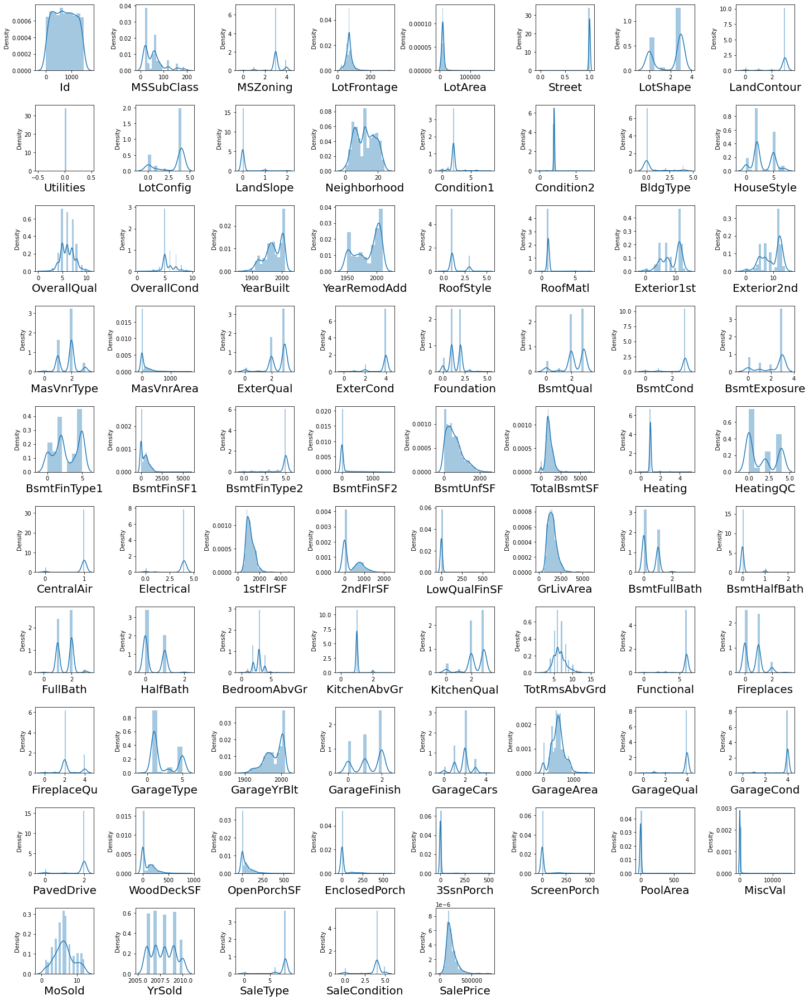

In [85]:
# let us now see the distribution of the "Train dataset"

plt.figure(figsize=(20,25), facecolor="white")
plotnumber = 1

for column in df_train:
    if plotnumber <=77:
        ax = plt.subplot(10,8, plotnumber)
        sns.distplot(df_train[column])
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.tight_layout()

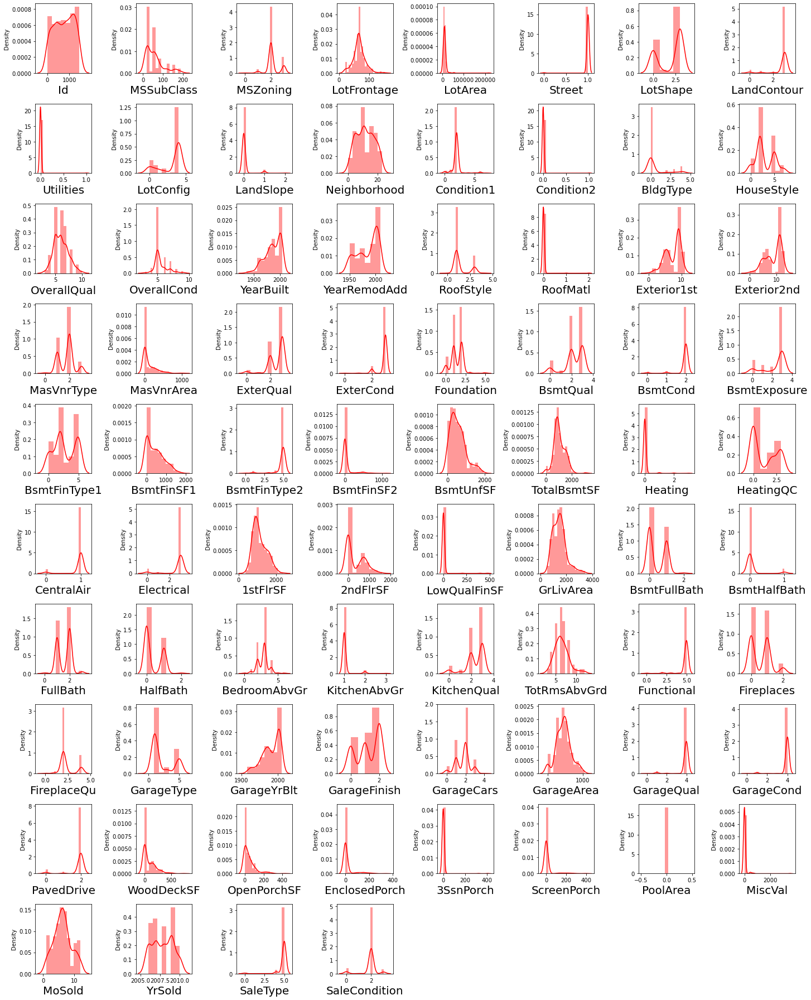

In [86]:
# let us now see the distribution of the "Test dataset"

plt.figure(figsize=(20,25), facecolor="white")
plotnumber = 1

for column in df_test:
    if plotnumber <=77:
        ax = plt.subplot(10,8, plotnumber)
        sns.distplot(df_test[column], color="red")
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.tight_layout()

# Lets compare both "Train" and "Test" datasets at the same time

#### We will use "Sweetviz" to analyze both the datasets
#### [Note: this library doesn't work in google colab, it works in Jupyter notebook ]

In [23]:
import sweetviz as sv

my_report1 =  sv.compare([df_train, "Train Dataset"], [df_test, "Test Dataset"])

                                             |          | [  0%]   00:00 -> (? left)

In [34]:
# run this line if you want to generate HTML rerport

my_report1.show_html("Train_vs_Test.html")

Report Train_vs_Test.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



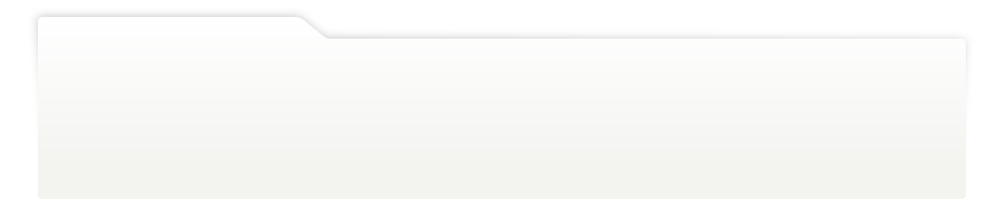
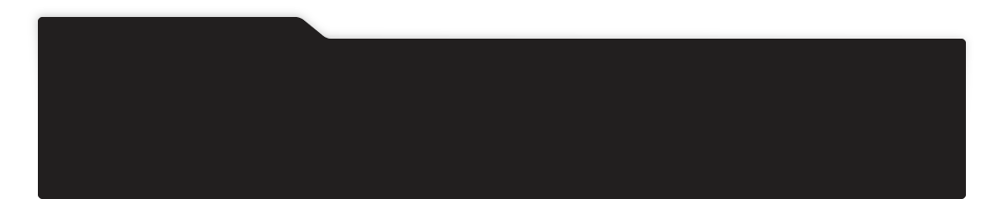
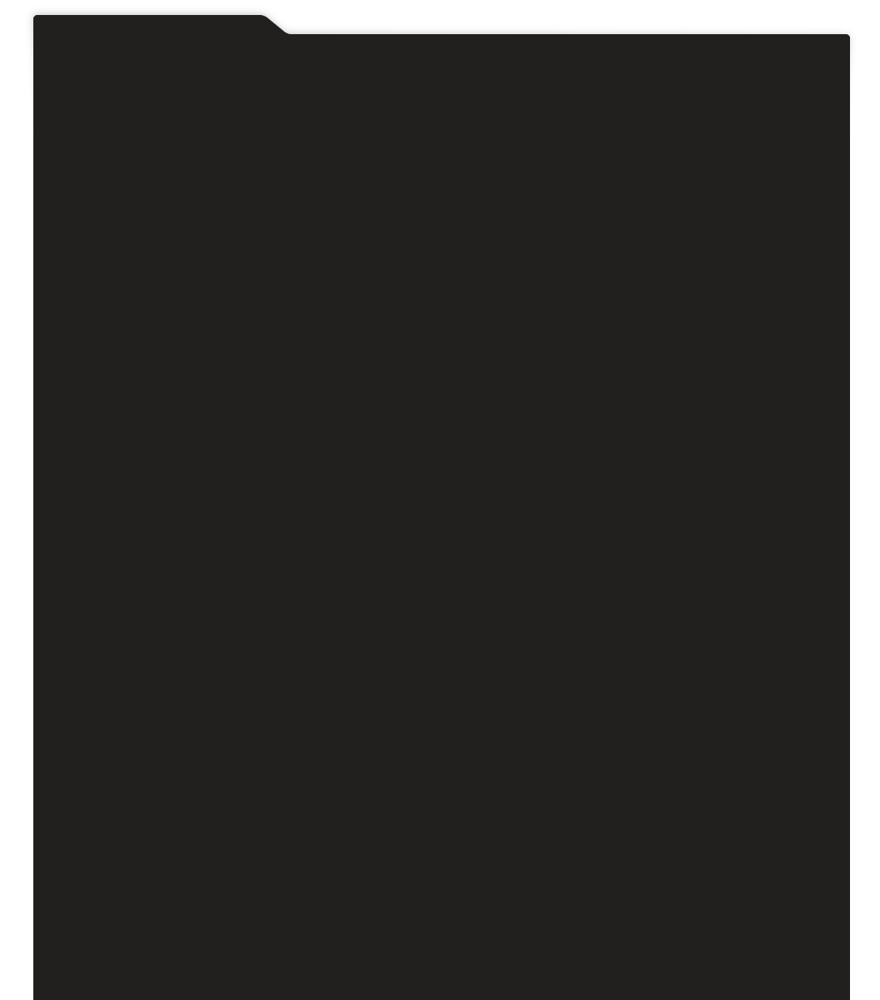
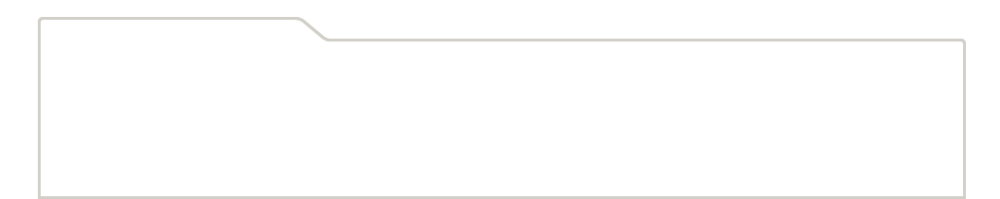
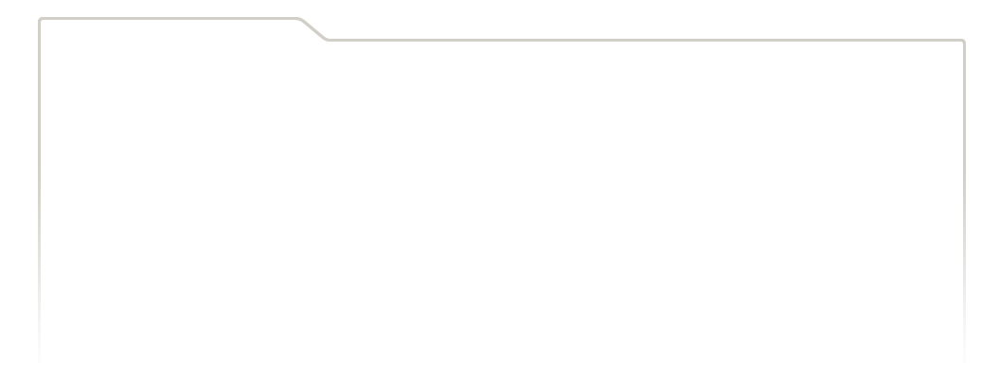
...
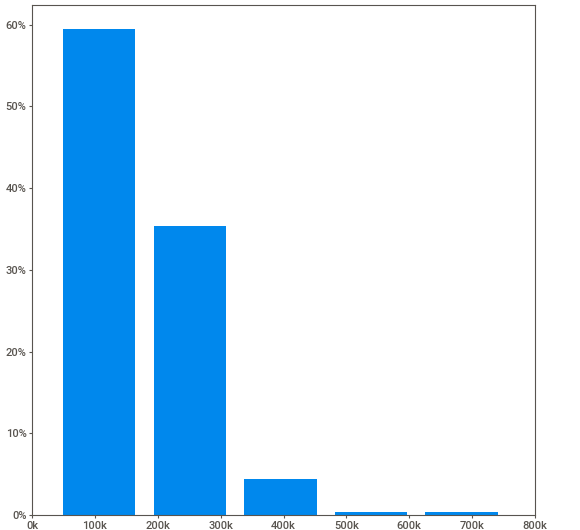
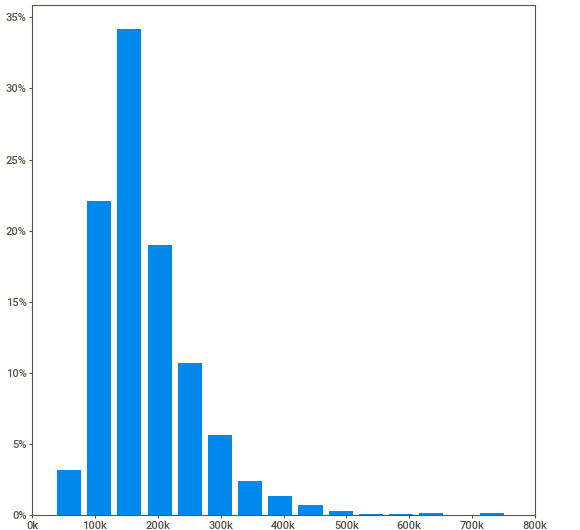
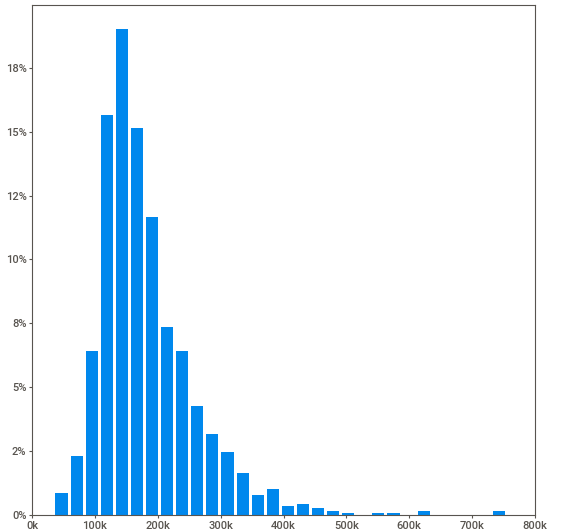
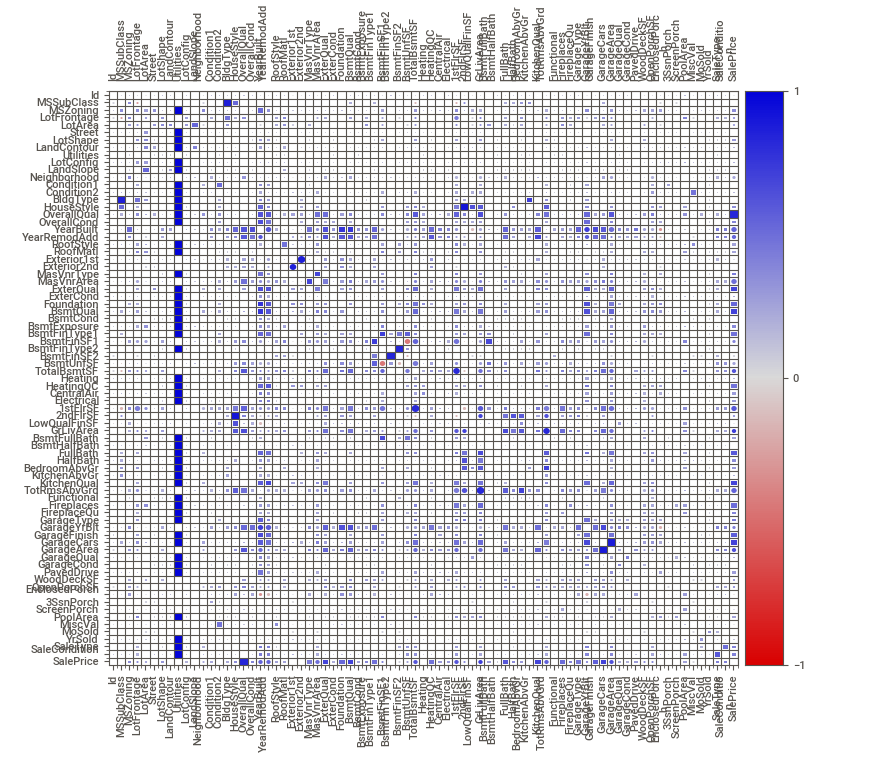
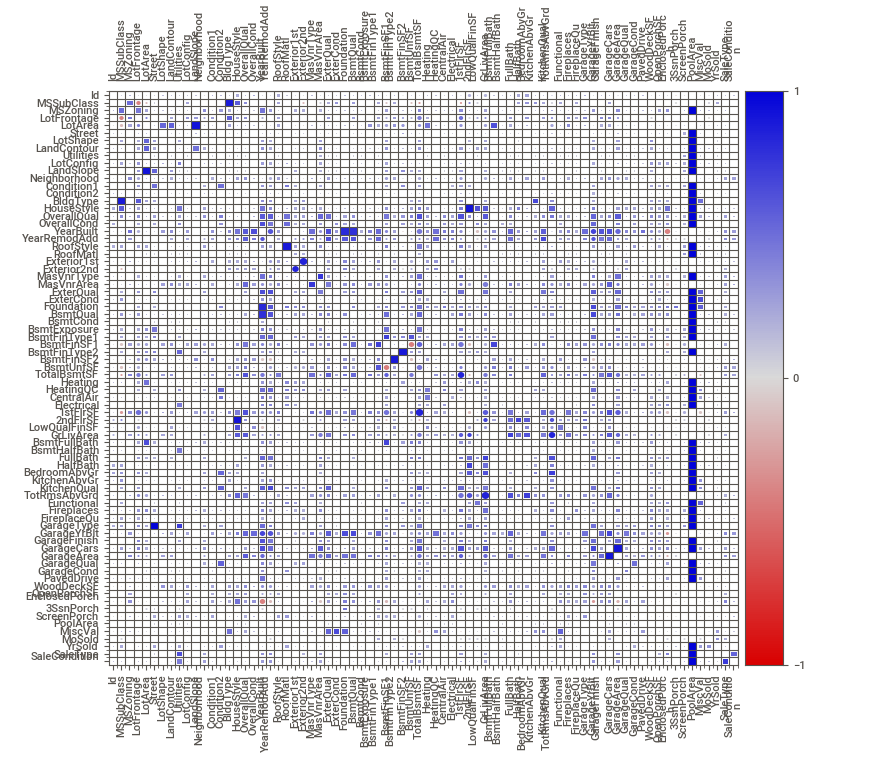

Report 'Train_vs_Test.html' was saved to storage.


In [24]:
# run this line if you want to generate the same report in Notebook itself

my_report1.show_notebook(filepath='Train_vs_Test.html', layout='widescreen', w=900)

## Correlation of the features with the dependent variable "Price"

#### We can see columns "Route", "Duration" and "Total_Stope" have a string correlation with the target variable "Price".

In [89]:
corr_matrix = df_train.corr()
corr_matrix["SalePrice"].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.707300
GarageCars       0.628329
GarageArea       0.619000
TotalBsmtSF      0.595042
1stFlrSF         0.587642
FullBath         0.554988
TotRmsAbvGrd     0.528363
YearBuilt        0.514408
YearRemodAdd     0.507831
MasVnrArea       0.463626
Fireplaces       0.459611
GarageYrBlt      0.381997
Foundation       0.374169
BsmtFinSF1       0.362874
OpenPorchSF      0.339500
2ndFlrSF         0.330386
LotFrontage      0.323779
WoodDeckSF       0.315444
HalfBath         0.295592
LotArea          0.249499
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
SaleCondition    0.217687
BsmtUnfSF        0.215724
BsmtFullBath     0.212924
HouseStyle       0.205502
Neighborhood     0.198942
RoofStyle        0.192654
RoofMatl         0.159865
BedroomAbvGr     0.158281
GarageCond       0.135071
Functional       0.118673
ExterCond        0.115167
Exterior1st      0.108451
Condition1       0.105820
PoolArea    

## Lets us now examine correlation using a "heatmap" for further clarification


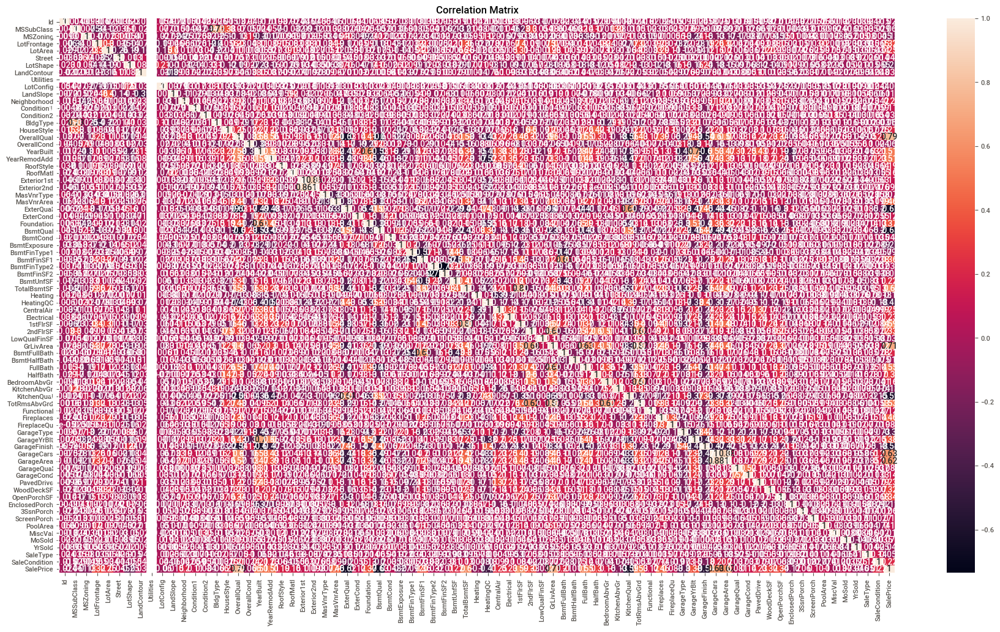

In [90]:
plt.figure(figsize=(22,12))
sns.heatmap(corr_matrix, annot=True)
plt.title("Correlation Matrix")
plt.show()

In [28]:
df_train.drop(columns = ["Id"], axis=1, inplace=True)
df_test.drop(columns = ["Id"], axis=1, inplace=True)

# Splitting up of dataset between x (features) and y (target column)

In [29]:
# train dataset with featurs only
x = df_train.drop(columns = ["SalePrice"], axis=1)

y = df_train["SalePrice"]

# test dataset with featurs only
x1 = df_test

# Lets us now Scale the data for further processing.¶

#### we have used StandardScaler for further scaling up of data 

In [30]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

x_scaled1 = scaler.fit_transform(x1)

# split the dataset into train and test data set

In [31]:

x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.30, random_state = 200)


# Create multi output regression models


#### In this scenario I have used a total of 7 regression algorithms including ensemble algorithms.



### 1) DecisionTreeRegressor

In [99]:
from sklearn.tree import DecisionTreeRegressor

dt_reg = DecisionTreeRegressor()
dt_reg.fit(x_train,y_train)

y_pred = dt_reg.predict(x_test)

print("Adjusted R2 squared : ",dt_reg.score(x_train,y_train))
print("Mean Absolute Error (MAE): ", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ",mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ",np.sqrt(mean_squared_error(y_test, y_pred)))

Adjusted R2 squared :  1.0
Mean Absolute Error (MAE):  25578.723646723647
Mean Squared Error (MSE):  1359837277.3618233
Root Mean Squared Error (RMSE):  36875.97154464982


### 2) RandomForestRegressor

In [100]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor()
rf_reg.fit(x_train,y_train)

y_pred = rf_reg.predict(x_test)

print("Adjusted R2 squared : ",rf_reg.score(x_train,y_train))
print("Mean Absolute Error (MAE): ", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ",mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ",np.sqrt(mean_squared_error(y_test, y_pred)))

Adjusted R2 squared :  0.9764839971754542
Mean Absolute Error (MAE):  18871.76133903134
Mean Squared Error (MSE):  1091641912.9978378
Root Mean Squared Error (RMSE):  33040.004736649746


### 3) ExtraTreesRegressor

In [101]:
from sklearn.ensemble import ExtraTreesRegressor

extra_reg = ExtraTreesRegressor()
extra_reg.fit(x_train,y_train)

y_pred = extra_reg.predict(x_test)

print("Adjusted R2 squared : ",extra_reg.score(x_train,y_train))
print("Mean Absolute Error (MAE): ", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ",mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ",np.sqrt(mean_squared_error(y_test, y_pred)))

Adjusted R2 squared :  1.0
Mean Absolute Error (MAE):  19839.853931623933
Mean Squared Error (MSE):  1241526745.211117
Root Mean Squared Error (RMSE):  35235.305379847596


### 4) KNeighborsRegressor

In [102]:
from sklearn.neighbors import KNeighborsRegressor

k_neigh = KNeighborsRegressor()
k_neigh.fit(x_train,y_train)

y_pred = k_neigh.predict(x_test)

print("Adjusted R2 squared : ",k_neigh.score(x_train,y_train))
print("Mean Absolute Error (MAE): ", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ",mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ",np.sqrt(mean_squared_error(y_test, y_pred)))

Adjusted R2 squared :  0.8303046044408277
Mean Absolute Error (MAE):  27257.960113960115
Mean Squared Error (MSE):  2474058856.8460402
Root Mean Squared Error (RMSE):  49739.91211136224


### 5) HistGradientBoostingRegressor

In [103]:
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor

hist_grad = HistGradientBoostingRegressor()
hist_grad.fit(x_train,y_train)

y_pred = hist_grad.predict(x_test)

print("Adjusted R2 squared : ",hist_grad.score(x_train,y_train))
print("Mean Absolute Error (MAE): ", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ",mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ",np.sqrt(mean_squared_error(y_test, y_pred)))

Adjusted R2 squared :  0.97802661116812
Mean Absolute Error (MAE):  19504.41223151312
Mean Squared Error (MSE):  1260819820.6607265
Root Mean Squared Error (RMSE):  35508.02473611742


### 6) GradientBoostingRegressor

In [104]:
from sklearn.ensemble import GradientBoostingRegressor

grid_reg = GradientBoostingRegressor()
grid_reg.fit(x_train,y_train)

y_pred = grid_reg.predict(x_test)

print("Adjusted R2 squared : ",grid_reg.score(x_train,y_train))
print("Mean Absolute Error (MAE): ", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ",mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ",np.sqrt(mean_squared_error(y_test, y_pred)))

Adjusted R2 squared :  0.9745853853585651
Mean Absolute Error (MAE):  19063.775356416183
Mean Squared Error (MSE):  1519508101.2212322
Root Mean Squared Error (RMSE):  38980.86840003994


# Cross validation to check if its overfitting

In [107]:
from sklearn.model_selection import cross_val_score

In [108]:
scr = cross_val_score(dt_reg, x, y, cv=5)
print("Cross Validation score of DecisionTreeRegressor model is:", scr.mean())

Cross Validation score of DecisionTreeRegressor model is: 0.7225223404501427


In [109]:
scr = cross_val_score(rf_reg, x, y, cv=5)
print("Cross Validation score of RandomForestRegressor model is:", scr.mean())

Cross Validation score of RandomForestRegressor model is: 0.8512853972653488


In [110]:
scr = cross_val_score(extra_reg, x, y, cv=5)
print("Cross Validation score of ExtraTreesRegressor model is:", scr.mean())

Cross Validation score of ExtraTreesRegressor model is: 0.8346042437410823


In [111]:
scr = cross_val_score(k_neigh, x, y, cv=5)
print("Cross Validation score of KNeighborsRegressor model is:", scr.mean())

Cross Validation score of KNeighborsRegressor model is: 0.6146861409759754


In [112]:
scr = cross_val_score(hist_grad, x, y, cv=5)
print("Cross Validation score of HistGradientBoostingRegressor model is:", scr.mean())

Cross Validation score of HistGradientBoostingRegressor model is: 0.8381162602258746


In [113]:
scr = cross_val_score(grid_reg, x, y, cv=5)
print("Cross Validation score of GradientBoostingRegressor model is:", scr.mean())

Cross Validation score of GradientBoostingRegressor model is: 0.863916928260322


# Selecting the best ML model for this dataset

#### From the below, it appears GradientBoostingRegressor is the appropriate algorithm for this scenario.

#### The difference between the adjusted R2 score and cross validation is much less for this algorithm compared to other 6 algorithms used.


| Sr.No | Models used | Adjusted R2 score | CV score| Difference output |
| --- | --- | --- | --- |---|
| 1 | DecisionTreeRegressor | 100 | 0.722522340450142 | 99.2774776595499 |
| 2 | RandomForestRegressor | 0.976483997175454 | 0.851285397265348 | 0.125198599910106 |
| 3 | ExtraTreesRegressor | 100 | 0.834604243741082 | 99.1653957562589 |
| 4 | KNeighborsRegressor | 0.830304604440827 | 0.614686140975975 | 0.215618463464852 |
| 5 | HistGradientBoostingRegressor | 0.97802661116812 | 0.838116260225874 | 0.139910350942246 |
| 6 | GradientBoostingRegressor | 0.974585385358565 | 0.863916928260322 | 0.110668457098243 |

# Hyper Parameter Tuning
### Let us try to tune the proposed model (GradientBoostingRegressor) to improve the outcome
#### The "paramaters" have been selected from the skicit library and I have considered 6 paramaters


In [34]:
parameters = {"loss":["ls", "lad", "huber", "quantile"],
              "criterion":["friedman_mse", "mse", "mae"],
              "max_features":["auto", "sqrt", "log2"],
              "n_estimators":[50, 70, 90, 100, 130, 150],
              "random_state":[50, 70, 90, 100, 130, 150],
              "tol":[1e-1, 1e-2, 1e-3, 1e-4, 1e-5]
              }

### RandomizedSearchCV is used to tune the parameters by fitting the same to the training dataset

In [136]:
from sklearn.model_selection import RandomizedSearchCV
RCV = RandomizedSearchCV(GradientBoostingRegressor(), parameters, cv=5, n_iter=10)

In [137]:
RCV.fit(x_train, y_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(),
                   param_distributions={'criterion': ['friedman_mse', 'mse',
                                                      'mae'],
                                        'loss': ['ls', 'lad', 'huber',
                                                 'quantile'],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'n_estimators': [50, 70, 90, 100, 130,
                                                         150],
                                        'random_state': [50, 70, 90, 100, 130,
                                                         150],
                                        'tol': [0.1, 0.01, 0.001, 0.0001,
                                                1e-05]})

In [138]:
RCV.best_params_

{'tol': 0.0001,
 'random_state': 100,
 'n_estimators': 130,
 'max_features': 'auto',
 'loss': 'ls',
 'criterion': 'friedman_mse'}

### Rebuild the model using the appropriate params we recieved from best_params_

In [35]:
mod_grid_reg = GradientBoostingRegressor(learning_rate= 0.0001, random_state= 100, n_estimators= 130, max_features= "auto",
                                         loss= "ls", criterion= "friedman_mse")

mod_grid_reg.fit(x_train,y_train)
pred = mod_grid_reg.predict(x_test)
pred

array([178113.48062088, 178418.69434369, 179309.2098604 , 178725.4984522 ,
       179309.2098604 , 177925.78329746, 177925.78329746, 178418.69434369,
       177925.78329746, 178418.69434369, 178113.48062088, 178418.69434369,
       177925.78329746, 179429.98369731, 179309.2098604 , 178725.4984522 ,
       179309.2098604 , 177925.78329746, 178725.4984522 , 180324.60170035,
       178418.69434369, 177925.78329746, 177925.78329746, 177925.78329746,
       179309.2098604 , 178418.69434369, 178418.69434369, 179309.2098604 ,
       178113.48062088, 178418.69434369, 177925.78329746, 177925.78329746,
       179429.98369731, 178725.4984522 , 179429.98369731, 178725.4984522 ,
       180324.60170035, 178113.48062088, 178113.48062088, 181392.6365669 ,
       178725.4984522 , 179429.98369731, 178418.69434369, 179309.2098604 ,
       177925.78329746, 178725.4984522 , 178418.69434369, 179309.2098604 ,
       177925.78329746, 179429.98369731, 177925.78329746, 178113.48062088,
       178418.69434369, 1

# Saving the model (using joblib)

In [153]:
import joblib
joblib.dump(mod_grid_reg,"Housing_Pred.pkl")

['Housing_Pred.pkl']

# Loading the saved model

In [27]:
model = joblib.load("Housing_Pred.pkl")

### Making prediction using the "Test Datset" as shown below

In [166]:
# df_test is the traning dataset, a different csv 

prediction = model.predict(x_scaled1)

prediction=pd.DataFrame(prediction)
prediction

,0
0,181392.636567
1,179429.983697
2,179429.983697
3,178725.498452
4,178418.694344
5,177925.783297
6,177925.783297
7,179429.983697
8,178725.498452
9,177925.783297


# Model Dashboard using ExplainerDashboard

In [41]:
X_train = pd.DataFrame(x_train, columns = x.columns)
X_test = pd.DataFrame(x_test, columns=x.columns)

In [42]:
from explainerdashboard import RegressionExplainer, ExplainerDashboard
explainer = RegressionExplainer(mod_grid_reg, X_test, y_test)

Generating self.shap_explainer = shap.TreeExplainer(model)


In [ ]:
from explainerdashboard import ExplainerDashboard
ExplainerDashboard(explainer).run()

Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...
Calculating predictions...
Calculating residuals...
Calculating absolute residuals...
Calculating shap interaction values...
Reminder: TreeShap computational complexity is O(TLD^2), where T is the number of trees, L is the maximum number of leaves in any tree and D the maximal depth of any tree. So reducing these will speed up the calculation.
Calculating dependencies...
Calculating importances...
Reminder: you can store the explainer (including calculated dependencies) with explainer.dump('explainer.joblib') and reload with e.g. ClassifierExplainer.from_file('explainer.joblib')
Registering callbacks...
Starting ExplainerDashboard on http://192.168.0.105:8050

 * Running on http://0.0.0.0:8050/ (Press CTRL+C to quit)
192.168.0.105 - - [17/Sep/2021 23:18:37] "GET / HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:38] "GET /_dash-layout HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:39] "GET /_dash-dependencies HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:40] "GET /_dash-component-suites/dash_core_components/async-graph.js HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:40] "GET /_dash-component-suites/dash_core_components/async-plotlyjs.js HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:40] "POST /_dash-update-component HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:40] "POST /_dash-update-component HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:40] "POST /_dash-update-component HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:40] "POST /_dash-update-component HTTP/1.1" 204 -
192.168.0.105 - - [17/Sep/2021 23:18:40] "POST /_dash-update-component HTTP/1.1" 200 -
192.168.0.105 - - [17/Sep/2021 23:18:4